# Basic EDA + Prices Prediction

Current solution consists of three parts:
1. <b>Data exploration, analysis and preprocessing.</b>
  - Data types
  - Null values
  - Correlation
  - Feature engineering
  - Skewness
  
  
2. <b>ML model building, evaluation.</b>
  - LinearRegression
  - Lasso Regression
  - Random Forest Regression
  - Hyperparameter tuning
  - Models comparison
  
  
3. <b>Prediction conduction.</b>
  
  

## 1. Data Exploration and Analysis

Adding imports, opening csv train + test files and exploring contents:

In [2]:
import matplotlib.pyplot as plt
import scipy.stats as ss
import seaborn as sns
import plotly.express as px
import math

import numpy as np
import pandas as pd

In [3]:
train = pd.read_csv('data/train.csv')
test = pd.read_csv('data/test.csv')

In [4]:
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

### Data types

Let's explore and graph unique dtypes:

In [6]:
dtypes_quantity = pd.DataFrame(train.dtypes.value_counts(), columns=['quantity'])
cols = [train.dtypes.unique()[x].name for x in range(0, len(train.dtypes.unique()))]

fig = px.bar(dtypes_quantity, x=cols, y="quantity")
fig.show(renderer="notebook")

As we see, the values are split in the ratio 38:42 (Id column excluded) for numeric and categorical values. 

That means, we should separately analyse what categoricals should be replaced with dummy data in order to participate in SalePrice prediction. 

But firstly let's clean data a bit.

### Null values

In [7]:
# null values detection
null_vals = pd.DataFrame(train.isnull().mean().sort_values(ascending=False), columns=["is_null"])

null_vals_to_drop = null_vals[null_vals["is_null"] > 0.75]

fig = px.bar(null_vals_to_drop, x=list(null_vals_to_drop.index), \
             y="is_null", title="Cols with null values quantity greater than 75% of presented data:")
fig.show(renderer="notebook")


Let's drop found cols; we're not gonna use it in our models, there's no need in analyzing them:

In [8]:
train_1 = train.copy()
for i in null_vals_to_drop.index:
    train_1.drop(i, axis = 1)

Filling left missing values:

In [9]:
for column in train_1:
    if type(train_1[column]) == 'object':
        train_1[column] = train_1[column].fillna(value='None')
    else:
        train_1[column] = train_1[column].fillna(value=0)



Getting lists of keys for numeric values and categoricals to work with them separately:

In [10]:
categoricals = list(train_1.dtypes[train_1.dtypes == "object"].keys())
numeric_values = list(train_1.dtypes[(train_1.dtypes == "int64") | (train_1.dtypes == "float64")].keys())
numeric_values.remove("Id") 

### Correlation Exploration

Let's see a measure of association between all features. 

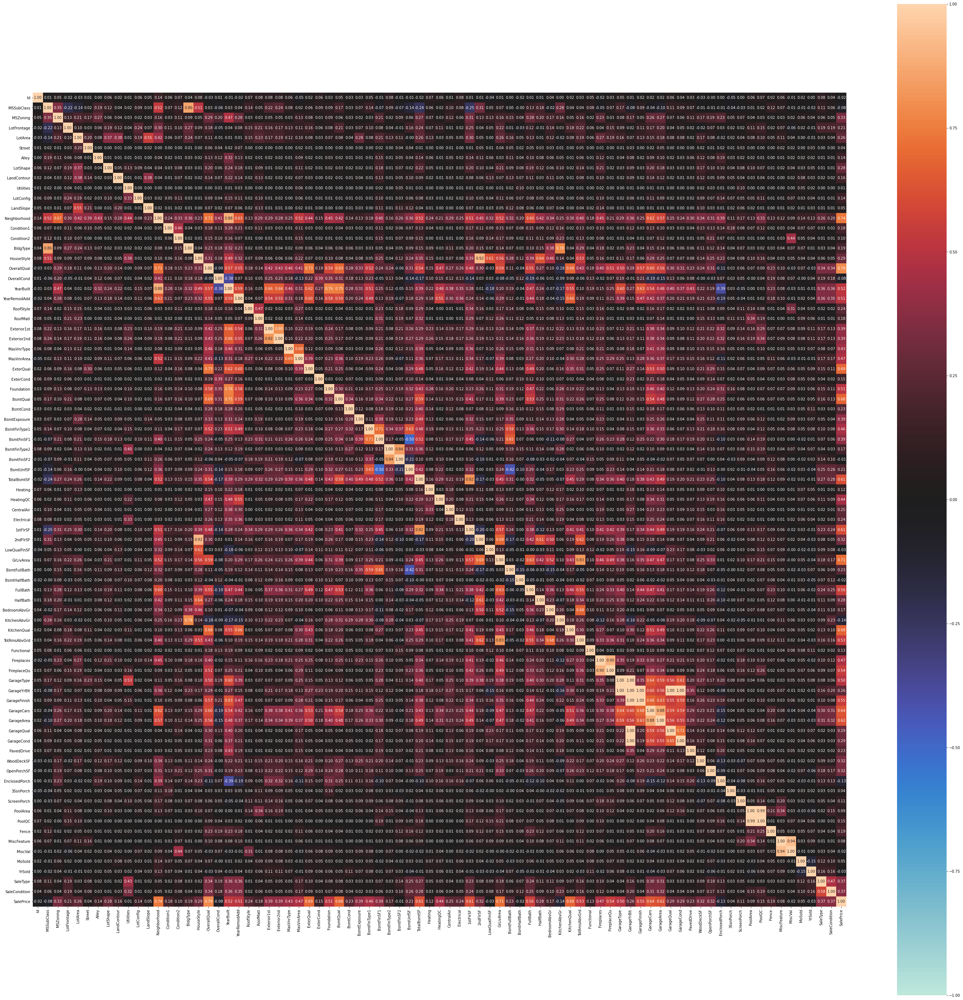

In [11]:
from dython.nominal import associations
res = associations(train_1, theil_u=True, plot=False, figsize=(50, 50))

Because of the dataset's features quantity the heatmap is pretty hard to explore.
Let's explore result array a bit more and find the most correlated features.

In [12]:
corr_w_saleprice = res["corr"]["SalePrice"]

corr_w_saleprice = pd.DataFrame(corr_w_saleprice)
max_cor_w_saleprice = corr_w_saleprice[corr_w_saleprice["SalePrice"] > 0.5].sort_values(by = "SalePrice", ascending=False)[1:]
max_cor_w_saleprice

,SalePrice
OverallQual,0.790982
Neighborhood,0.738630
GrLivArea,0.708624
ExterQual,0.690933
BsmtQual,0.681905
KitchenQual,0.675721
GarageCars,0.640409
GarageArea,0.623431
TotalBsmtSF,0.613581
1stFlrSF,0.605852


Here's the list of features that have high correlation with SalePrice: 

In [13]:
print(list(max_cor_w_saleprice.index))

['OverallQual', 'Neighborhood', 'GrLivArea', 'ExterQual', 'BsmtQual', 'KitchenQual', 'GarageCars', 'GarageArea', 'TotalBsmtSF', '1stFlrSF', 'FullBath', 'GarageFinish', 'FireplaceQu', 'TotRmsAbvGrd', 'YearBuilt', 'YearRemodAdd', 'Foundation']


Now let's explore correlation between other features: 

In [14]:
fig = px.imshow(res["corr"][res["corr"] > 0.5])
fig.show(renderer="notebook")

Let's take a clother look at these features:

In [15]:
highly_corr_vals = res["corr"][res["corr"] > 0.5]

# extracting lower trianguar matrix
highly_corr_vals = highly_corr_vals.where(np.triu(np.ones(highly_corr_vals.shape), k=1).astype(bool)).stack().reset_index()

pd.set_option("display.max_rows", None, "display.max_columns", None)
highly_corr_vals.sort_values(by = 0, ascending=False)

,level_0,level_1,0
97,GarageYrBlt,GarageFinish,0.999025
92,GarageType,GarageYrBlt,0.998872
100,GarageYrBlt,GarageQual,0.998786
101,GarageYrBlt,GarageCond,0.998732
115,PoolArea,PoolQC,0.990775
116,MiscFeature,MiscVal,0.935741
16,HouseStyle,2ndFlrSF,0.916506
90,Fireplaces,FireplaceQu,0.901204
5,Neighborhood,YearBuilt,0.883812
107,GarageCars,GarageArea,0.882475


Let's compare list of features that has high correlation with SalePrice and see if it has redundant features, that we can ignore while making a model.

List of features that has high correlation with SalePrice:
<i>'OverallQual', 'Neighborhood', 'GrLivArea', 'ExterQual', 'BsmtQual', 'KitchenQual', 'GarageCars', 'GarageArea', 'TotalBsmtSF', '1stFlrSF', 'FullBath', 'GarageFinish', 'FireplaceQu', 'TotRmsAbvGrd', 'YearBuilt', 'YearRemodAdd', 'Foundation'</i>.

<i>GarageCars</i> is highly correlated with <i>GarageArea</i>, <i>GarageCars</i> feature is redundant, we'll take <b><i>GarageArea</i></b> feature to our model.

<i>Neighborhood</i> is highly associated with <i>YearBuilt</i>. 
This means that in the city of Ames, houses that were built earlier, with a high degree of probability, are located in the historical center, and, accordingly, are more expensive. Therefore, we can exclude the <i>YearBuilt</i> feature and take into account only the <b><i>Neighborhood</i></b> of the house, since the correlation between the <i>Neighborhood</i> and <i>SalePrice</i> is higher than that of the <i>YearBuilt</i> and <i>SalePrice</i>.

There's also high correlation between <i>GrLivArea</i>	and <i>TotRmsAbvGrd</i>. Let's include <b><i>GrLivArea</i></b> in our model and ignore <i>TotRmsAbvGrd</i> feature. 


### Feature engineering

Let's create some new features and explore whether they correlate with saleprice.

<i><b>been_remodeled</i></b>: indicates whether house have been remodeled.

<i><b>total_bath</i></b>: total quantity of all bathrooms in the house.

<i><b>lot_shape_regular</i></b>: indicates whether lot shape is regular or curved.

<i><b>land_contour_flat</i></b>: indicates whether lot contour is flat.

<i><b>is_residental</i></b>: indicates whether house's general zoning classification is residental.

<i><b>house_rating</i></b>: mean of the overall condition and overall material and finish of the house.

<i><b>sf_per_car</i></b>: number of garage area per car in square feet.

<i><b>general_porch_area</i></b>: total square feet of a porch area.

<i><b>shed_sf</i></b>: square feet of a shed.

<i><b>general_sf</i></b>: total square feet of all premises.

In [16]:
train_1 = train.copy()

engineered_features = pd.DataFrame()
engineered_features["SalePrice"] = train_1["SalePrice"]

engineered_features["been_remodeled"] = train_1.apply(lambda x: 1 if x["YearBuilt"] == x["YearRemodAdd"]\
                                                      else 0, axis = 1)

engineered_features["total_bath"] = train_1.apply(lambda x: x["BsmtFullBath"] + \
                                      x["BsmtHalfBath"] * 0.5 + x["FullBath"] + x["HalfBath"] * 0.5, axis = 1)

engineered_features["lot_shape_regular"] = train_1.apply(lambda x: 1 if x["LotShape"] == "Reg"\
                                                         else 0, axis = 1)

engineered_features["land_contour_flat"] = train_1.apply(lambda x: 1 if x["LandContour"] == "Lvl"\
                                                         else 0, axis = 1)

residental_buildings = ["FV", "RH", "RL", "RP", "RM"]
engineered_features["is_residental"] = train_1.apply(lambda x: 1 if x["MSZoning"] in residental_buildings\
                                                     else 0, axis = 1)

engineered_features["house_rating"] = train_1.apply(lambda x: (x["OverallQual"] + x["OverallCond"]) / 2, axis = 1)
engineered_features["sf_per_car"] = train_1.apply(lambda x: x["GarageArea"] / x["GarageCars"] \
                                                if x["GarageCars"] != 0 else 0, axis = 1)

engineered_features["general_porch_area"] = train_1.apply(lambda x: x["OpenPorchSF"] + \
                                                        x["EnclosedPorch"] + x["3SsnPorch"] \
                                                        + x["ScreenPorch"], axis = 1)

engineered_features["shed_sf"] = train_1.apply(lambda x: x["MiscVal"] if x["MiscFeature"] == "Shed" \
                                              else 0, axis = 1)

#general square feet per buildings, includes: Shed, Posrch, Basement, Garage and living area
sf_cols = ["OpenPorchSF", "EnclosedPorch", "3SsnPorch", "ScreenPorch", "GrLivArea", "GarageArea", "TotalBsmtSF"]
engineered_features["general_sf"] = train_1.apply(lambda x: x[sf_cols].sum() + x["MiscVal"] if \
                                                 x["MiscFeature"] == "Shed" \
                                                 else x[sf_cols].sum(), axis = 1)

In [17]:
import plotly.figure_factory as ff

mask = np.zeros_like(engineered_features.corr())
mask[np.triu_indices_from(mask)] = True
mask = np.array(mask, dtype=bool)

ef = engineered_features.corr().mask(mask)

fig = ff.create_annotated_heatmap(
    z=ef.to_numpy().round(3),
    x=list(engineered_features.corr().index.values),
    y=list(engineered_features.corr().columns.values),       
    xgap=3, ygap=3,
    zmin=-1, zmax=1,
    colorscale='greens',
    colorbar_thickness=30,
    colorbar_ticklen=3
)

fig.update_layout(title_text='<b>Correlation Matrix (engineered features)<b>',
                  title_x=0.5,
                  titlefont={'size': 24},
                  width=900, height=900,
                  xaxis_showgrid=False,
                  xaxis={'side': 'bottom'},
                  yaxis_showgrid=False,
                  yaxis_autorange='reversed',                   
                  paper_bgcolor='white'
                  )
fig.show(renderer="notebook")

As we can see, there's only a few features that are highly correlated with SalePrice, we'll take them into account while creating our model.

In [18]:
top_e_features = list(engineered_features.corr()[engineered_features.corr()["SalePrice"] > 0.5].index)[1:]
train_1[top_e_features] = engineered_features[top_e_features].copy()

top_e_features

['total_bath', 'house_rating', 'general_sf']

### Skewness

Let's explore skewness of features that we're going to use in our model.

In [19]:
train_2 = train_1[['total_bath', 'house_rating', 'general_sf', 'Neighborhood', \
                  'BsmtQual', 'KitchenQual', 'ExterQual', 'GarageFinish', \
                  'FireplaceQu', 'YearRemodAdd', 'Foundation', "SalePrice"]]

skewness = pd.DataFrame()

skewness[['Positive Columns','Skewness(+v)']] = train_2.skew()[train_2.skew() > 0].sort_values(ascending=False).reset_index()
skewness[['Negative Columns','Skewness(-v)']] = train_2.skew()[train_2.skew() < 0].sort_values(ascending=True).reset_index()

skewness.columns = pd.MultiIndex.from_tuples([('Positive Skewness', 'Columns'), ('Positive Skewness', 'Skewness'),
                                              ('Negative Skewness', 'Columns'), ('Negative Skewness', 'Skewness')])
skewness

Positive Skewness           Negative Skewness          
            Columns  Skewness           Columns  Skewness
0         SalePrice  1.882876      YearRemodAdd -0.503562
1        general_sf  1.472845      house_rating -0.424850
2        total_bath  0.264676               NaN       NaN

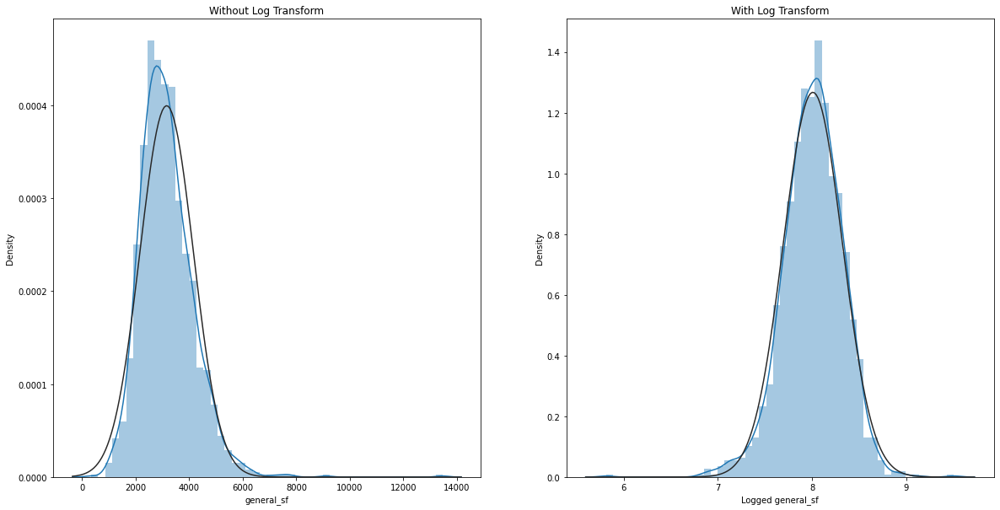

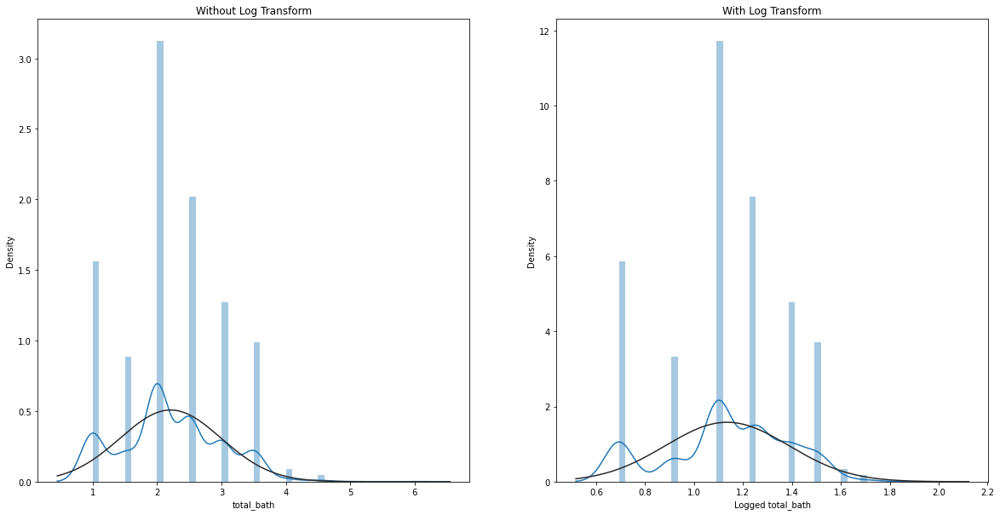

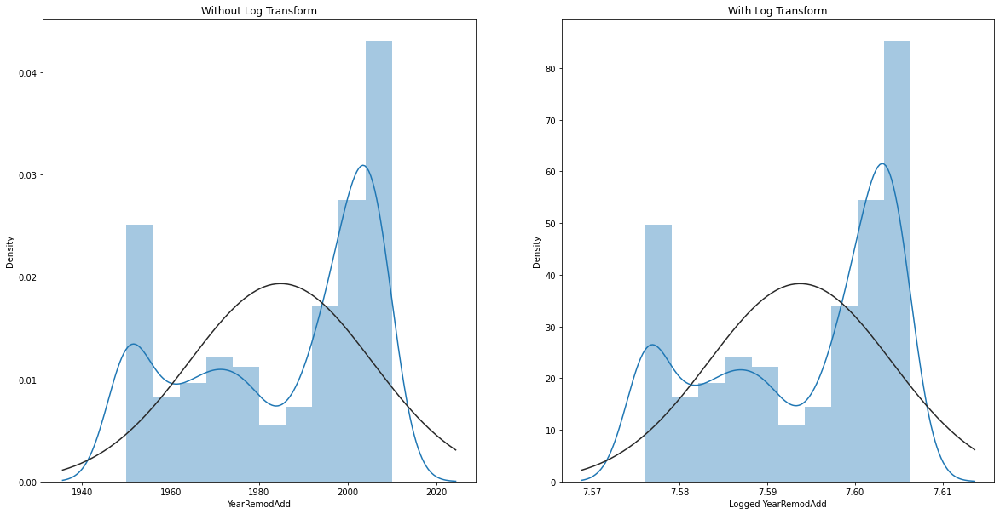

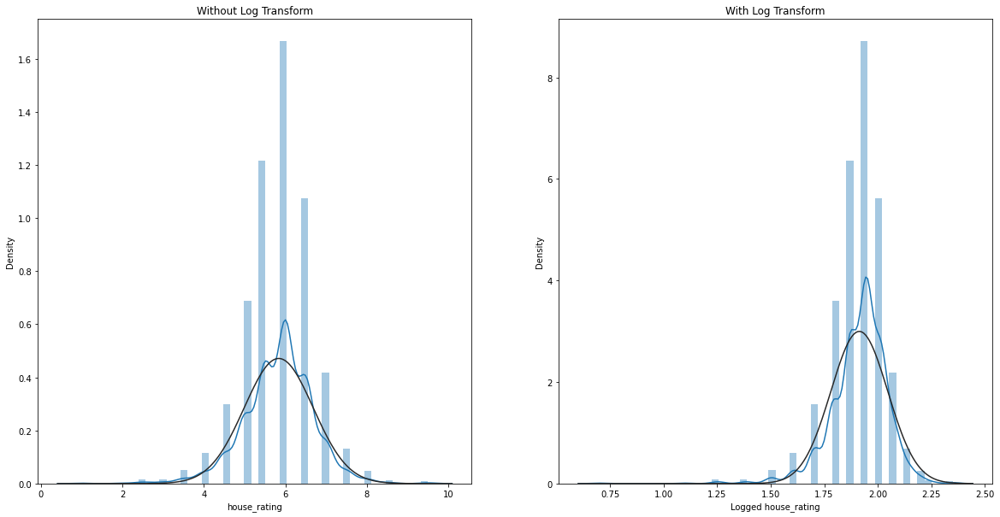

In [20]:
# Visualize columns with highest Skewness
numeric_values = ["general_sf", "total_bath",  "YearRemodAdd", "house_rating"]

import scipy

import warnings
warnings.filterwarnings("ignore")

for col in numeric_values:
    plt.figure(figsize=(20, 10))

    plt.subplot(1, 2, 1)
    sns.distplot(train_2[col], kde=True, fit=scipy.stats.norm)
    plt.xlabel(col)
    plt.title("Without Log Transform")

    plt.subplot(1, 2, 2)
    sns.distplot(np.log1p(train_2[col]), kde=True, fit=scipy.stats.norm)
    plt.xlabel("Logged " + col)
    plt.title("With Log Transform")

    plt.show()


The values for asymmetry between -2 and +2 are considered acceptable in order to prove normal univariate distribution, but let's do the logarithmic transformation of <i>general_sf</i> feature. 

In [21]:
train_2["general_sf"] = np.log1p(train_1["general_sf"])

## 2. ML model building, validation.

Creating a df with selected columns, creating dummy variables for categorical data:

In [22]:
from sklearn.model_selection import train_test_split

# preparing test.csv set
def prepare_test_set(test):
    # fill na values
    for column in test:
        if type(test[column]) == 'object':
            test[column] = test[column].fillna(value='None')
        else:
            test[column] = test[column].fillna(value=0)
    
    #conduct feature engineering
    e_f = pd.DataFrame()
    e_f["total_bath"] = test.apply(lambda x: x["BsmtFullBath"] + \
                                          x["BsmtHalfBath"] * 0.5 + x["FullBath"] + x["HalfBath"] * 0.5, axis = 1)

    e_f["house_rating"] = test.apply(lambda x: (x["OverallQual"] + x["OverallCond"]) / 2, axis = 1)

    sf_cols = ["OpenPorchSF", "EnclosedPorch", "3SsnPorch", "ScreenPorch", "GrLivArea", "GarageArea", "TotalBsmtSF"]
    e_f["general_sf"] = test.apply(lambda x: x[sf_cols].sum() + x["MiscVal"] if \
                                                     x["MiscFeature"] == "Shed" \
                                                     else x[sf_cols].sum(), axis = 1)

    top_e_features = ['total_bath', 'house_rating', 'general_sf']
    
    # adding engineered features to test ds 
    test[top_e_features] = e_f[top_e_features].copy()
    
    # normalizing general_sf feature
    test["general_sf"] = np.log1p(test["general_sf"])
    
    df_model = test[['total_bath', 'house_rating', 'general_sf', 'Neighborhood', \
                      'BsmtQual', 'KitchenQual', 'ExterQual', 'GarageFinish', \
                      'FireplaceQu', 'YearRemodAdd', 'Foundation']]
    X_test_csv = pd.get_dummies(df_model)
    
    return X_test_csv

X_test_csv = prepare_test_set(test)


# preparing train set 
df_model = train_2[['total_bath', 'house_rating', 'general_sf', 'Neighborhood', \
                  'BsmtQual', 'KitchenQual', 'ExterQual', 'GarageFinish', \
                  'FireplaceQu', 'YearRemodAdd', 'Foundation', "SalePrice"]]
df_dum = pd.get_dummies(df_model)

X = df_dum.drop("SalePrice", axis = 1)
y = df_dum.SalePrice.values


# checking if all test columns presented in train set
missing_cols = set( X.columns ) - set( X_test_csv.columns )

# Add a missing column in test set with default value equal to 0
for c in missing_cols:
    X_test_csv[c] = 0
    
# making test columns order same as in training set
X_test_csv = X_test_csv[X.columns]

# creating train test split from train.csv ds
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=42)

Let's take MAE as a metric to evaluate the model: we don't have much outliers so there's no need in usage MSE & RMSE.

### Linear Regression

In [23]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score

lr = LinearRegression().fit(X_train, y_train)
lr.score(X_train, y_train)

mae = np.mean(cross_val_score(lr, X_train, y_train, scoring="neg_mean_absolute_error"))
print(f"LinearRegression\nMAE: {mae}")

LinearRegression
MAE: -93627986617.52005


### Lasso Regression

In [24]:
from sklearn.linear_model import Lasso

lasso_r = Lasso()
lasso_r.fit(X_train,y_train)
np.mean(cross_val_score(lasso_r, X_train, y_train, scoring="neg_root_mean_squared_error"))
#l_reg.score(X_train,y_train)

mae = np.mean(cross_val_score(lasso_r, X_train, y_train, scoring="neg_mean_absolute_error"))

print(f"LassoRegression\nMAE: {mae}")


LassoRegression
MAE: -21436.246096459516


### Random Forest Regression

In [25]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()
rf.fit(X_train, y_train)

mae = np.mean(cross_val_score(rf, X_train, y_train, scoring="neg_mean_absolute_error"))

print(f"RandomForestRegressor\nMAE: {mae}")


RandomForestRegressor
MAE: -18828.574802711395


 ### Hyperparameter tuning

In [26]:
from sklearn.model_selection import GridSearchCV
parameters = {'n_estimators':range(10,300,10), 'criterion':('mse','mae'), 'max_features':('auto','sqrt','log2')}

gs = GridSearchCV(rf,parameters,scoring='neg_mean_absolute_error',cv=3)
gs.fit(X_train,y_train)

gs.best_estimator_

RandomForestRegressor(criterion='mse', max_features='auto', n_estimators=110)

In [27]:
gs.best_params_

{'criterion': 'mse', 'max_features': 'auto', 'n_estimators': 110}

In [28]:
from sklearn.metrics import mean_absolute_error

lr_predict = lr.predict(X_test)
lasso_r_predict = lasso_r.predict(X_test)
rf_predict = gs.predict(X_test)

print("Linear Regression:")
print(mean_absolute_error(y_test, lr_predict))
print("\nLasso Regression")
print(mean_absolute_error(y_test, lasso_r_predict))
print("\nRandom Forest Regression")
print(mean_absolute_error(y_test, rf_predict))
print()

# testing ensembles

print("\nLinear Regression and Lasso Regression:")
print(mean_absolute_error(y_test, (lr_predict + lasso_r_predict)/2))
print("\nLinear Regression and Random Forest Regression:")
print(mean_absolute_error(y_test, (lr_predict + rf_predict)/2))
print("\nRandom Forest Regression and Lasso Regression:")
print(mean_absolute_error(y_test, (rf_predict + lasso_r_predict)/2))

Linear Regression:
20604.984190248055

Lasso Regression
20603.89048414441

Random Forest Regression
17393.539527169938


Linear Regression and Lasso Regression:
20604.2634986559

Linear Regression and Random Forest Regression:
17012.839309755178

Random Forest Regression and Lasso Regression:
17014.775267140787


## 3. Prediction conduction.

In [29]:
lr_predict = lr.predict(X_test_csv)
rf_predict = gs.predict(X_test_csv)

result = pd.DataFrame(index = test["Id"])
result["SalePrice"] = (rf_predict + lr_predict)/2



f = open("prediction.csv", "a")
f.write(result.to_csv(index=True))
f.close()

In [30]:
print (f'Final model\'s MAE is about { (17102.599763654584 * 100 / y_test.mean()).round() }% of the mean house price')

Final model's MAE is about 10.0% of the mean house price


In [31]:
import plotly.figure_factory as ff

mask = np.zeros_like(df_model.corr())
mask[np.triu_indices_from(mask)] = True
mask = np.array(mask, dtype=bool)

ef = df_model.corr().mask(mask)

fig = ff.create_annotated_heatmap(
    z=ef.to_numpy().round(3),
    x=list(df_model.corr().index.values),
    y=list(df_model.corr().columns.values),       
    xgap=3, ygap=3,
    zmin=-1, zmax=1,
    colorscale='greens',
    colorbar_thickness=30,
    colorbar_ticklen=3
)

fig.update_layout(title_text='<b>Correlation Matrix (final model)<b>',
                  title_x=0.5,
                  titlefont={'size': 24},
                  width=900, height=900,
                  xaxis_showgrid=False,
                  xaxis={'side': 'bottom'},
                  yaxis_showgrid=False,
                  yaxis_autorange='reversed',                   
                  paper_bgcolor='white'
                  )
fig.show(renderer="notebook")